In [1]:
import os
import itertools
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
from tqdm import tqdm
import pickle

from PIL import Image
from IPython import display
import cv2
import moviepy.editor as mpy
from base64 import b64encode

import torch
from torch.nn.functional import grid_sample
from torchvision.transforms.functional import to_tensor, resize

In [2]:
video_path = 'datasets/microscope/micro1/micro1.mp4'
frames_path = video_path.rsplit('/', 1)[0] + '/frames'
cropped_frames_path = video_path.rsplit('/', 1)[0] + '/cropped_frames'
processed_frames_path = video_path.rsplit('/', 1)[0] + '/processed_frames'
os.makedirs(frames_path, exist_ok=True)
os.makedirs(cropped_frames_path, exist_ok=True)
os.makedirs(processed_frames_path, exist_ok=True)

device = 'cuda'

In [3]:
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['image.cmap'] = 'binary'

def tensor_to_img(x):
	return Image.fromarray(x.clip(0, 1).movedim(-3, -1).detach().cpu()
		.multiply(255).type(torch.uint8).numpy())

def file_to_tensor(path):
	return to_tensor(Image.open(path)).to(device)

def display_video(path, loop=True):
	mp4 = open(path, 'rb').read()
	data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
	display.display(display.HTML(f'''<video src="{
		data_url}" controls=true autoplay=true {
		"loop=true " if loop else ""}/>'''))

In [4]:
convert_video = False

if convert_video:
	# ~5m
	vidcap = cv2.VideoCapture(video_path)
	frame_id = 0
	# take_range = (100, 121)
	take_range = (0, int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT)))
	# n_imgs = take_range[1] - take_range[0]
	n_imgs = 0
	skip_ctr = 0
	for _ in tqdm(range(take_range[1])):
		skip_ctr += 1
		
		success, img = vidcap.read()
		
		if skip_ctr < take_range[0]:
			continue
		if not success:
			print('video ended')
			break
		if skip_ctr >= take_range[1]:
			break
		
		img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
		Image.fromarray(img).save(f'{frames_path}/{frame_id}.jpg', quality=95)
		frame_id += 1
		n_imgs += 1
else:
	n_imgs = 9413

First frame in test range:


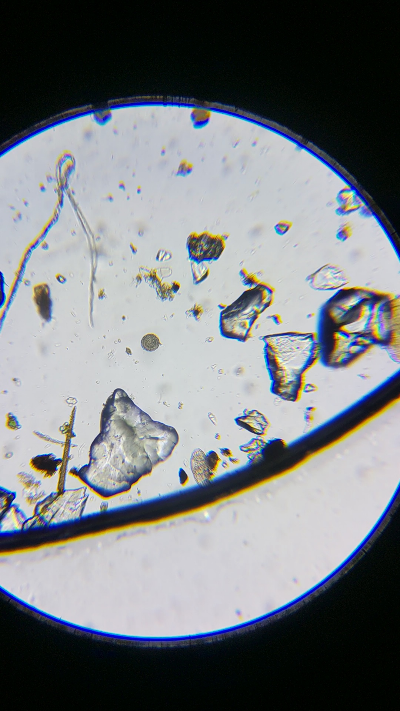

In [5]:
print('First frame in test range:')
img0 = file_to_tensor(f'{frames_path}/0.jpg')
display.display(tensor_to_img(resize(img0, 400)))

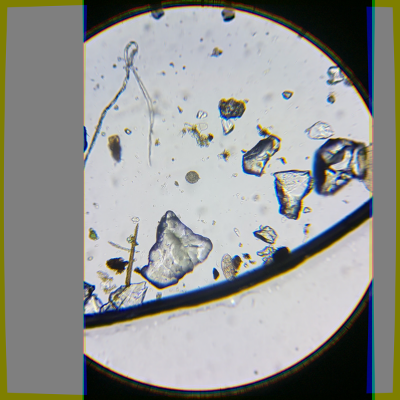

In [6]:
img_shape = (3, 1920, 1080) # (c, h, w)
center = torch.tensor([1010, 435], device=device) # (y, x)
radius = torch.tensor([750], device=device)
distortion_alphas = torch.nn.Parameter(torch.tensor([-0.01, 0, 0.02], device=device))
# distortion_alphas = torch.nn.Parameter(torch.zeros(3, device=device))

def crop_frame(img, new_size=600):
	# center cropped img in new_img
	new_img = torch.full((3, radius * 2, radius * 2), .5, device=device)
	img_crop = img[:, max(center[0] - radius, 0) : center[0] + radius,
		max(center[1] - radius, 0) : center[1] + radius]
	offset = (radius - center).maximum(torch.tensor([0], device=device))
	new_img[:, offset[0] : offset[0] + img_crop.shape[1],
		offset[1] : offset[1] + img_crop.shape[2]] = img_crop
	
	return resize(new_img, new_size).clip(0, 1)

def process(img, new_size=600, is_cropped=True):
	if not is_cropped:
		img = crop_frame(img, new_size=new_size)
	
	# get grid
	grid_x, grid_y = torch.meshgrid(
		*[torch.linspace(-1, 1, max(img.shape[-2:]), device=device)
		for _ in range(2)], indexing='xy'
	)
	grid = torch.stack([grid_x, grid_y], dim=-1)[None]
	# batch dim is used for channel-specific sampling
	grid = grid.repeat(3, 1, 1, 1)
	
	# convert to polar and correct distortion
	polar_r = grid.norm(dim=-1)
	grid_polar = torch.stack([
		polar_r / (1 - distortion_alphas[:, None, None] * polar_r**2),
		torch.atan2(grid[..., 1], grid[..., 0])
	], dim=-1)
	
	# convert back to cartesian
	grid = torch.stack([
		torch.cos(grid_polar[..., 1]),
		torch.sin(grid_polar[..., 1])
	], dim=-1) * grid_polar[..., 0, None]
	
	# resample
	new_img = grid_sample(
		img[None].expand(3, -1, -1, -1), grid,
		mode='bicubic', align_corners=True
	)
	new_img = torch.stack([new_img[0, 0], new_img[1, 1], new_img[2, 2]], dim=0)
	
	return resize(new_img, new_size).clip(0, 1)

display.display(tensor_to_img(resize(process(img0.cuda(), is_cropped=False), 400)))

In [7]:
write_cropped_frames = False

for i in tqdm(range(n_imgs if write_cropped_frames else 0)):
	orig_img = file_to_tensor(f'{frames_path}/{i}.jpg')
	cropped_img = tensor_to_img(crop_frame(orig_img))
	cropped_img.save(f'{cropped_frames_path}/{i}.jpg', quality=95)

0it [00:00, ?it/s]


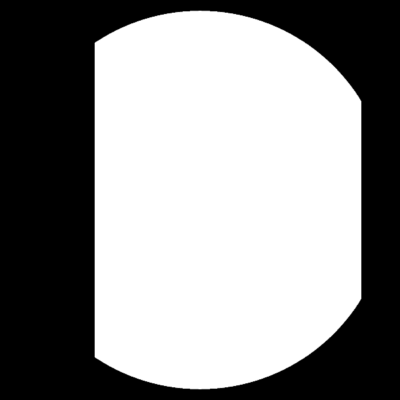

In [8]:
def get_base_mask(pad=40):
	base_mask = torch.ones(1, radius * 2, radius * 2, device=device)

	# set area outside image bounds to zero
	placeholder_img = torch.empty(img_shape, device=device)
	placeholder_img = placeholder_img[:,
		max(center[0] - radius, 0) : center[0] + radius,
		max(center[1] - radius, 0) : center[1] + radius
	]
	offset = (radius - center).maximum(torch.tensor([0], device=device))
	# u/d
	base_mask[:, :offset[0] + pad] = 0
	base_mask[:, max(offset[0] + placeholder_img.shape[1] - pad, 0):] = 0
	# l/r
	base_mask[:, :, :offset[1] + pad] = 0
	base_mask[:, :, max(offset[1] + placeholder_img.shape[2] - pad, 0):] = 0
	
	# get grid
	grid_x, grid_y = torch.meshgrid(
		*[torch.linspace(-1, 1, radius.item() * 2, device=device)
		for _ in range(2)], indexing='xy'
	)
	grid = torch.stack([grid_x, grid_y], dim=-1)
	
	# convert to polar
	grid_polar = torch.stack([
		grid.norm(dim=-1),
		torch.atan2(grid[..., 1], grid[..., 0])
	], dim=-1)

	# set area outside circle to zero
	base_mask[:, grid_polar[..., 0] > 1 - pad / radius] = 0
	return base_mask


base_mask_600 = resize(get_base_mask(), 600)
display.display(resize(tensor_to_img(base_mask_600.expand(3, -1, -1)), 400))

In [9]:
# get image distance at multiple scales
def mse_scales(images, masks=None, num_scales=8, scale_ratio=1.5):
	"""
	Get image distance using multiple scales
	Args:
		images: List of two image tensors of shape (b, c, h, w)
		masks: Corresponding masks, difference is multiplied by their intersection
		num_scales: Number of times images are scaled down
		scale_ratio: Images are scaled down by this factor
	Returns:
		Weighted average of MSEs s.t. expected value is the same at each scale
	"""
	# don't modify passed lists
	images = [*images]
	if masks is None:
		masks = [torch.ones_like(img[:, :1]) for img in images]
	else:
		masks = [*masks]
	
	losses = []
	weights = [1]
	for _ in range(num_scales - 1):
		mask_both = torch.mul(*masks)
		mask_mean = mask_both.mean()
		if mask_mean == 0:
			mask_mean = 1
		losses.append(torch.nn.functional.mse_loss(*[
			img * mask_both for img in images
		]) / mask_mean)
		for i in range(2):
			next_size = torch.tensor(images[i].shape[-2:]) // scale_ratio
			next_size = torch.maximum(next_size, torch.ones_like(next_size))
			next_size = next_size.int().tolist()
			images[i] = resize(images[i], next_size)
			masks[i] = resize(masks[i], next_size)
		
		# todo: correct math for this and weight scaling
		weights.append(weights[-1] * scale_ratio**.5)
	
	weights = torch.tensor(weights[:-1], device=device)
	weights = weights / weights.sum() * num_scales**2
	# print(weights)
	losses = torch.stack(losses, dim=0)
	
	return (losses * weights).sum()

## Manual track

In [10]:
def stabilize_image(img, cam, img_size=600, mask=None):
	"""
	Translate img by cam coordinates (in range [-1, 1])
	Returns:
		Translated img and mask
	"""	
	if mask is None:
		mask = torch.ones_like(img[:1])
	
	# get grid
	grid_x, grid_y = torch.meshgrid(
		[torch.linspace(-1, 1, img_size, device=device)
		for _ in range(2)], indexing='xy'
	)
	grid = torch.stack([grid_x, grid_y], dim=-1)
	
	# translate by cam
	grid += cam[None, None]
	img_warped = grid_sample(img[None], grid[None], mode='bicubic', align_corners=True)[0]
	mask_warped = grid_sample(mask[None], grid[None], mode='bicubic', align_corners=True)[0]
	
	return [img_warped.clip(0, 1), mask_warped.clip(0, 1)]

In [11]:
tqdm._instances.clear()

def show_stabilized(
	start_frame=0, end_frame=n_imgs,
	fps=24, clip_path='output/pmv.mp4', skip_frames=0
):
	"""
	Visualize camera stabilization.
	Start and end frame arguments can either be ints or lists of ints.
	If they're lists, video will be a compilation of multiple stabilized segments.
	Segments should not overlap - end_frame is noninclusive.
	Use skip_frames to speed up video (3x: skip_frames=2).
	"""
	if type(start_frame) is int:
		start_frame = [start_frame]
	if type(end_frame) is int:
		end_frame = [end_frame]
	
	all_frames = [*itertools.chain(
		*[range(sf, ef, skip_frames + 1) for sf, ef in zip(start_frame, end_frame)]
	)]
	
	frame_state = {
		'first_img': process(file_to_tensor(
				f'{cropped_frames_path}/{all_frames[0]}.jpg')
			).detach(),
		'first_img_i': all_frames[0]
	}
	# undistort images and translate by cam_track
	def make_frame(t):
		i = min(max(int(t / (1 / fps)), 0), len(all_frames) - 1)
		if all_frames[i] in start_frame:
			frame_state['first_img'] = process(file_to_tensor(
				f'{cropped_frames_path}/{all_frames[i]}.jpg')
			).detach()
			frame_state['first_img_i'] = all_frames[i]

		img = process(file_to_tensor(f'{cropped_frames_path}/{all_frames[i]}.jpg'))
		img_warped, _ = stabilize_image(img,
			cam_track[all_frames[i]] - cam_track[frame_state['first_img_i']]
		)

		img = frame_state['first_img'] * 0.5 + img_warped * 0.5
		return np.array(tensor_to_img(img))

	clip = mpy.VideoClip(make_frame, duration=len(all_frames) / fps)
	clip.write_videofile(clip_path, fps=fps)
	display_video(clip_path, loop=True)

cam_track = torch.zeros(n_imgs, 2, device=device)
with torch.no_grad():
	cam_track[100:121] = torch.stack([
		torch.linspace(0, 0.15, 21, device=device),
		torch.zeros(21, device=device)
	], dim=-1)

show_stabilized(100, 120)

Moviepy - Building video output/pmv.mp4.
Moviepy - Writing video output/pmv.mp4



Moviepy - Done !
Moviepy - video ready output/pmv.mp4


## Automatic track

 10%|▉         | 59998/600000 [39:47<6:04:57, 24.66it/s] 

saving process vals


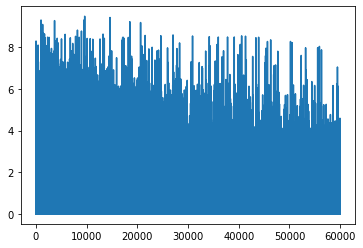

 10%|▉         | 59998/600000 [39:58<6:04:57, 24.66it/s]

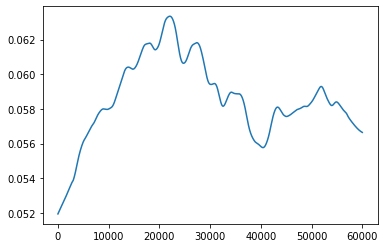

 20%|█▉        | 119997/600000 [1:19:43<5:07:28, 26.02it/s]

saving process vals


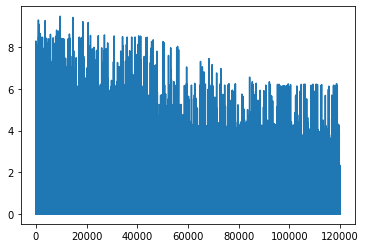

 20%|█▉        | 119997/600000 [1:19:59<5:07:28, 26.02it/s]

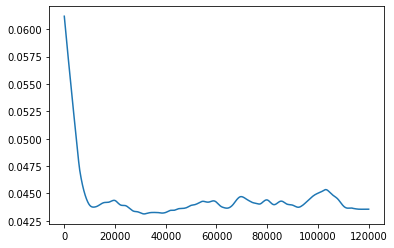

 30%|██▉       | 179997/600000 [2:03:01<4:56:13, 23.63it/s]   

saving process vals


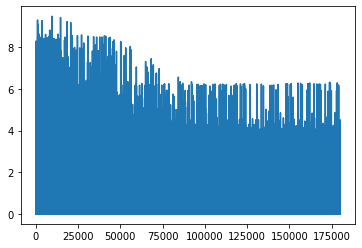

 30%|██▉       | 179997/600000 [2:03:19<4:56:13, 23.63it/s]

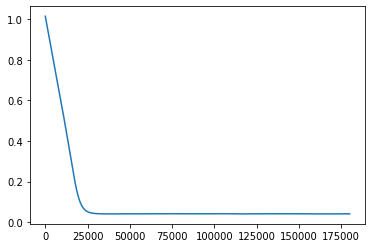

 40%|███▉      | 239998/600000 [2:51:07<3:46:33, 26.48it/s]   

saving process vals


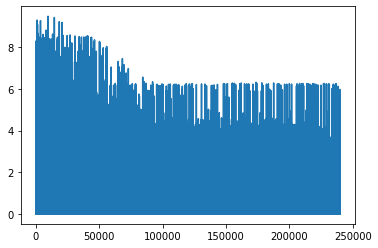

 40%|███▉      | 239998/600000 [2:51:19<3:46:33, 26.48it/s]

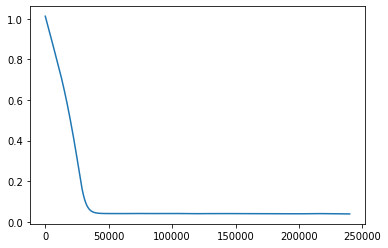

 50%|████▉     | 299998/600000 [3:46:09<3:28:26, 23.99it/s]     

saving process vals


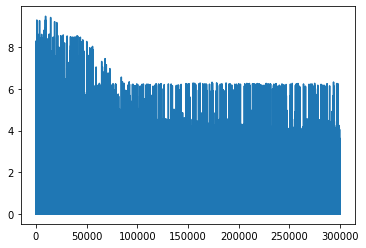

 50%|████▉     | 299998/600000 [3:46:29<3:28:26, 23.99it/s]

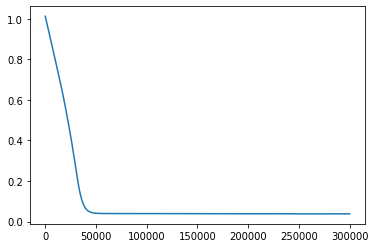

 60%|█████▉    | 359997/600000 [4:50:13<2:37:33, 25.39it/s]     

saving process vals


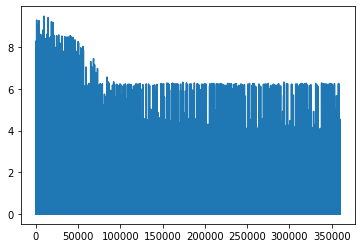

 60%|█████▉    | 359997/600000 [4:50:29<2:37:33, 25.39it/s]

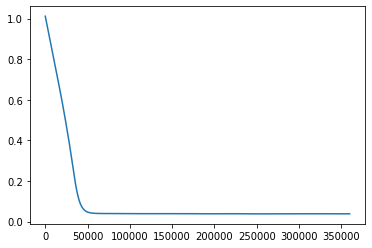

 70%|██████▉   | 419997/600000 [6:05:44<1:57:01, 25.64it/s]     

saving process vals


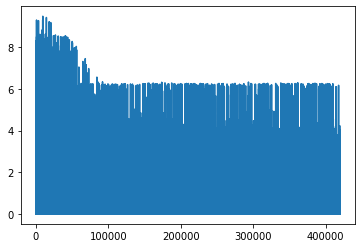

 70%|██████▉   | 419997/600000 [6:05:59<1:57:01, 25.64it/s]

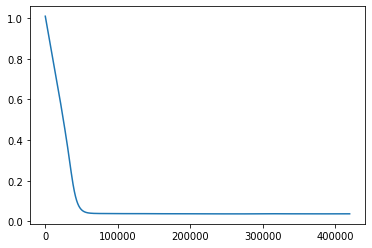

 80%|███████▉  | 479999/600000 [7:34:30<1:18:03, 25.62it/s]     

saving process vals


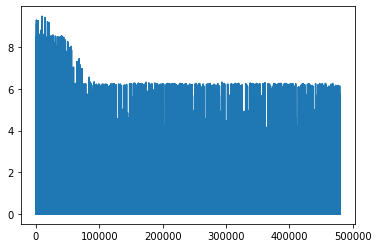

 80%|███████▉  | 479999/600000 [7:34:40<1:18:03, 25.62it/s]

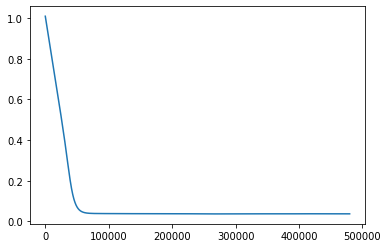

 90%|████████▉ | 539998/600000 [9:18:49<37:49, 26.44it/s]       

saving process vals


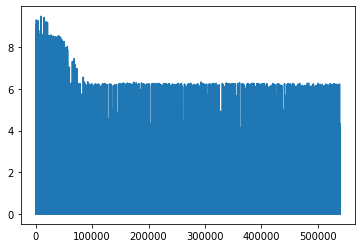

 90%|████████▉ | 539998/600000 [9:19:00<37:49, 26.44it/s]

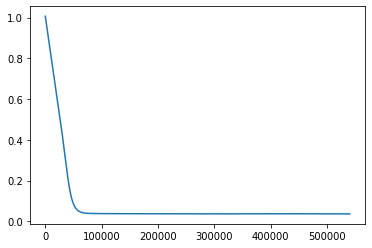

100%|█████████▉| 599998/600000 [11:21:45<00:00, 25.30it/s]      

saving process vals


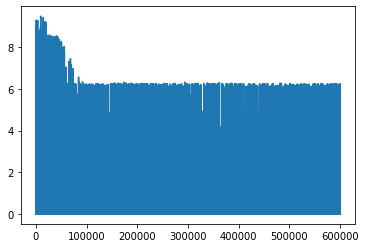

100%|█████████▉| 599998/600000 [11:22:01<00:00, 25.30it/s]

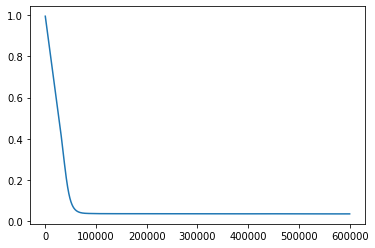

100%|██████████| 600000/600000 [13:41:11<00:00, 12.18it/s] 


writing processed frames


100%|██████████| 9413/9413 [05:15<00:00, 29.83it/s]


In [12]:
cam_deltas = torch.nn.Parameter(torch.zeros(n_imgs, 2, device=device))
opt = torch.optim.Adam(
	torch.nn.ParameterList([cam_deltas, distortion_alphas]),
	lr=0.00001
)

n_steps = 600000
max_frame_dist = 20
losses = []

for train_step in tqdm(range(n_steps)):
	left_i = np.random.randint(n_imgs - 1)
	right_i = min(
		left_i + np.random.randint(max_frame_dist) + 1,
		n_imgs - 1
	)
	cam_delta = cam_deltas[left_i:right_i].sum(dim=0)

	left_img = file_to_tensor(f'{cropped_frames_path}/{left_i}.jpg')
	left_img = process(left_img)
	right_img = file_to_tensor(f'{cropped_frames_path}/{right_i}.jpg')
	right_img = process(right_img)

	right_img_warped, mask_warped = stabilize_image(right_img, cam_delta, 600, base_mask_600)
	loss = mse_scales(
		[left_img[None], right_img_warped[None]],
		[base_mask_600[None], mask_warped[None]]
	)
	
	opt.zero_grad()
	loss.backward()
	opt.step()
	losses.append(loss.item())

	# save process vals if not nan
	if (train_step + 1) % (n_steps // 10) == 0 or train_step + 1 == n_steps:
		if cam_deltas.isnan().any() or distortion_alphas.isnan().any():
			print('nan - not saving')
		else:
			print('saving process vals')
			cam_track = torch.cat([
				torch.zeros_like(cam_deltas[:1]),
				cam_deltas.cumsum(dim=0)[:-1]
			], dim=0)
			
			vid_base_dir = video_path.rsplit('/', 1)[0]
			with open(f'{vid_base_dir}/process.pkl', 'wb') as f:
				pickle.dump({
					'img_shape': img_shape,
					'center': center.cpu(),
					'radius': radius.cpu(),
					'cam_track': cam_track.detach().cpu(),
					'distortion_alphas': distortion_alphas.detach().cpu()
				}, f)
		
			# todo: show less loss points 
			# (not much info from default graph and lowess takes a long time)
			plt.plot(losses)
			plt.show()
			plt.plot(lowess(losses, np.arange(len(losses)), frac=.1)[:, 1])
			plt.show()


# write processed frames if process vals not nan
if cam_deltas.isnan().any() or distortion_alphas.isnan().any():
	print('process vals are nan - can\'t write processed frames')
else:
	print('writing processed frames')
	for img_i in tqdm(range(n_imgs)):
		cropped_img = file_to_tensor(f'{cropped_frames_path}/{img_i}.jpg')
		processed_img = tensor_to_img(process(cropped_img))
		processed_img.save(f'{processed_frames_path}/{img_i}.jpg')

In [13]:
cam_track = torch.cat([
	torch.zeros_like(cam_deltas[:1]),
	cam_deltas.cumsum(dim=0)[:-1]
], dim=0)

show_stabilized(100, 120)

Moviepy - Building video output/pmv.mp4.
Moviepy - Writing video output/pmv.mp4



Moviepy - Done !
Moviepy - video ready output/pmv.mp4


In [14]:
print(cam_track[100:121])
print(distortion_alphas)

tensor([[ 0.0867, -0.0007],
        [ 0.0934, -0.0011],
        [ 0.0974, -0.0013],
        [ 0.1009, -0.0013],
        [ 0.1092, -0.0019],
        [ 0.1188, -0.0026],
        [ 0.1268, -0.0029],
        [ 0.1365, -0.0034],
        [ 0.1474, -0.0039],
        [ 0.1556, -0.0041],
        [ 0.1608, -0.0040],
        [ 0.1710, -0.0047],
        [ 0.1840, -0.0051],
        [ 0.1911, -0.0058],
        [ 0.1934, -0.0057],
        [ 0.1985, -0.0065],
        [ 0.2083, -0.0069],
        [ 0.2158, -0.0070],
        [ 0.2189, -0.0074],
        [ 0.2224, -0.0080],
        [ 0.2265, -0.0086]], device='cuda:0', grad_fn=<SliceBackward0>)
Parameter containing:
tensor([-0.0090, -0.0039,  0.0124], device='cuda:0', requires_grad=True)


In [15]:
tqdm._instances.clear()
# save video of 20 stabilized segments (3x speed)
start_frames = []
end_frames = []
for i in range(20):
	start_frames.append(int((n_imgs - 1) / 20 * i))
	end_frames.append(int((n_imgs - 1) / 20 * (i + 1)))

show_stabilized(
	start_frames, end_frames, fps=24,
	clip_path='output/pmv-full.mp4', skip_frames=2
)

Moviepy - Building video output/pmv-full.mp4.
Moviepy - Writing video output/pmv-full.mp4



Moviepy - Done !
Moviepy - video ready output/pmv-full.mp4
